<a href="https://colab.research.google.com/github/6dreamhigh/baekjoon/blob/main/fr.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

1.모델 학습을 위한 데이터셋(dataset) 준비하기

In [ ]:
import warnings
warnings.filterwarnings("ignore")
import tensorflow as tf
import tensorflow_datasets as tfds

# (raw_train, raw_validation, raw_test), metadata = tfds.load(
#     name='tf_flowers',
#     split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],#train, validation ,test
#     data_dir='/content/drive/MyDrive/flower/flower_photos',
#     download=False,#다운로드하지 않고 바로 위치에 넣을것
#     with_info=True,
# ,
# )

In [ ]:
import pathlib

dataset_url = "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"
data_dir = tf.keras.utils.get_file(origin=dataset_url, 
                                   fname='flower_photos', 
                                   untar=True)
data_dir = pathlib.Path(data_dir)

228827136/228813984 [==============================] - 2s 0us/step


In [ ]:
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    name='tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],#train, validation ,test
    # data_dir = pathlib.Path(data_dir)
    data_dir='/content/drive/MyDrive/flower',
    download=True,
    as_supervised=True,
    with_info=True
)

In [ ]:
raw_train

<PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>

In [ ]:
print(raw_train)
print(raw_validation)
print(raw_test)

<PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


2. 데이터 시각화를 통해 확인하고, 모델에 입력할 수 있는 형태로 전처리하기

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

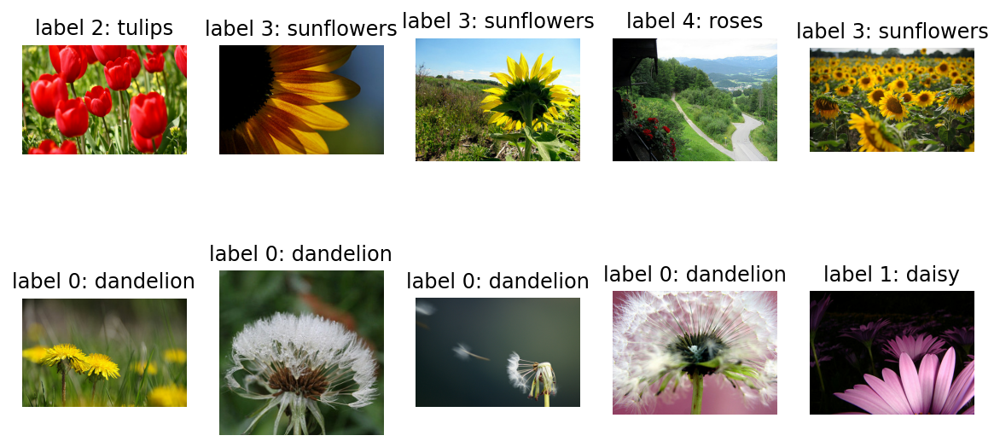

In [ ]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):  # 인덱스별로 10개의 데이터를 가져 옵니다.
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')#축을 보여줄지 말지

In [ ]:
IMG_SIZE = 160 # 리사이징할 이미지의 크기
#float(160)
def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1 # 픽셀값의 scale 수정
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))#160,160 픽셀로 바꿔주는 format함수
    return image, label

In [ ]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


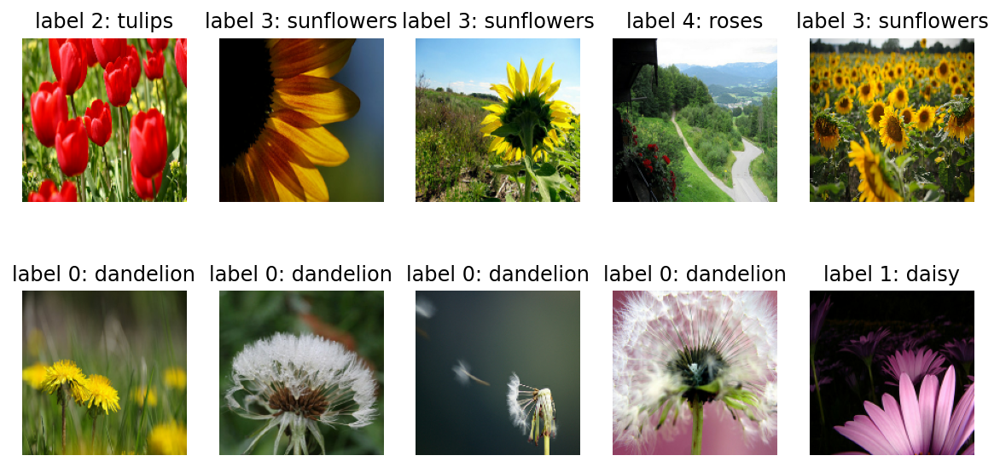

In [ ]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

3. 텐서플로우를 활용해 모델 구조 설계하기

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D


In [ ]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=5, activation='softmax')
])

In [ ]:
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 160, 160, 16)      448       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 80, 80, 16)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 80, 80, 32)        4640      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 40, 40, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 40, 40, 64)        18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 20, 20, 64)      

4.모델 compile 완료 후 학습시키기

In [ ]:
learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])


In [ ]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

In [ ]:
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

In [ ]:
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

11/20 [===============>..............] - ETA: 0s - loss: 1.6011 - accuracy: 0.2727

20/20 [==============================] - 1s 25ms/step - loss: 1.6034 - accuracy: 0.2752
initial loss: 1.60
initial accuracy: 0.28


In [ ]:
EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
92/92 [==============================] - 5s 44ms/step - loss: 1.3187 - accuracy: 0.4387 - val_loss: 1.2372 - val_accuracy: 0.4741
Epoch 2/10
92/92 [==============================] - 5s 42ms/step - loss: 1.0585 - accuracy: 0.5753 - val_loss: 1.0556 - val_accuracy: 0.5504
Epoch 3/10
92/92 [==============================] - 5s 42ms/step - loss: 0.9177 - accuracy: 0.6403 - val_loss: 0.9903 - val_accuracy: 0.6158
Epoch 4/10
92/92 [==============================] - 5s 42ms/step - loss: 0.8020 - accuracy: 0.6901 - val_loss: 0.9817 - val_accuracy: 0.6185
Epoch 5/10
92/92 [==============================] - 5s 42ms/step - loss: 0.7105 - accuracy: 0.7347 - val_loss: 0.9760 - val_accuracy: 0.6240
Epoch 6/10
92/92 [==============================] - 5s 42ms/step - loss: 0.6049 - accuracy: 0.7905 - val_loss: 0.8996 - val_accuracy: 0.6431
Epoch 7/10
92/92 [==============================] - 5s 42ms/step - loss: 0.5285 - accuracy: 0.8202 - val_loss: 1.0143 - val_accuracy: 0.5777
Epoch 8/10
92

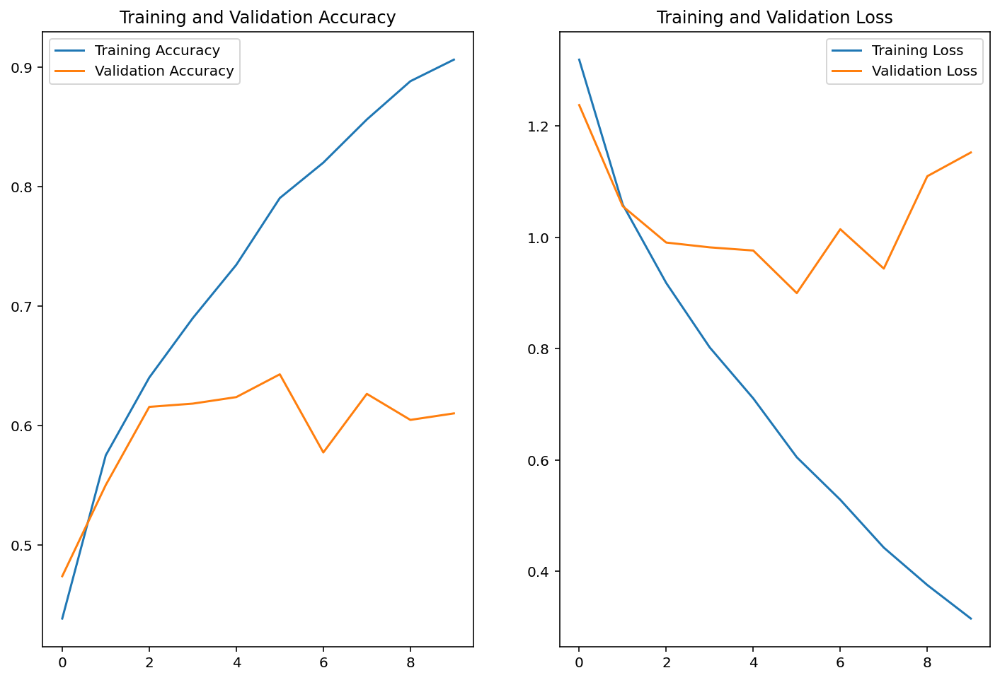

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    break

predictions

array([[1.40062184e-03, 2.78218766e-04, 6.45144954e-02, 8.87053728e-01,
        4.67529595e-02],
       [3.14004987e-01, 6.79835498e-01, 3.97129031e-03, 2.21820301e-04,
        1.96630345e-03],
       [3.03708792e-01, 8.07684585e-02, 9.80449319e-02, 4.97462869e-01,
        2.00149100e-02],
       [2.49490198e-02, 5.17566279e-02, 4.76715863e-01, 6.37069866e-02,
        3.82871538e-01],
       [7.38297403e-01, 5.30111268e-02, 1.57999899e-02, 7.38317445e-02,
        1.19059667e-01],
       [1.60544455e-01, 2.11385533e-01, 3.55999731e-02, 2.62944192e-01,
        3.29525888e-01],
       [6.16071688e-04, 1.55455977e-01, 5.77268302e-01, 8.36331919e-02,
        1.83026388e-01],
       [2.58132350e-02, 6.58840463e-02, 1.29139602e-01, 4.14004415e-01,
        3.65158677e-01],
       [7.19835982e-04, 1.98492726e-05, 1.62836467e-03, 9.97270286e-01,
        3.61606624e-04],
       [9.43061531e-01, 5.03037125e-02, 7.60225696e-04, 8.10184632e-04,
        5.06420434e-03],
       [7.95572758e-01, 7.7980

In [ ]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([3, 1, 3, 2, 0, 4, 2, 3, 3, 0, 0, 3, 3, 4, 4, 3, 2, 3, 1, 4, 2, 0,
       1, 0, 1, 0, 4, 3, 2, 3, 0, 0])

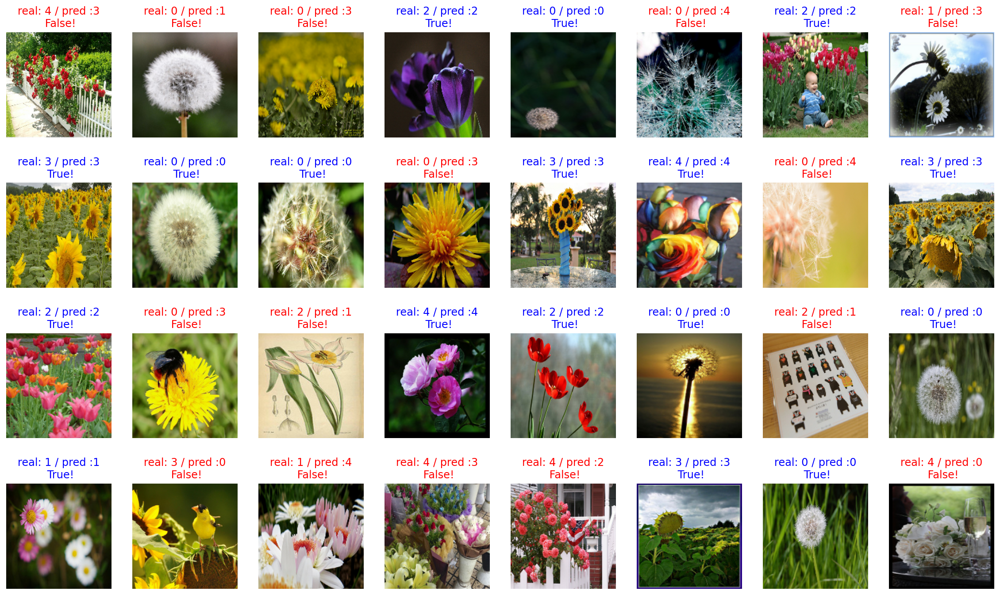

In [ ]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [ ]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100)  

53.125


In [ ]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

In [ ]:
image_batch.shape

TensorShape([32, 160, 160, 3])

In [ ]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [ ]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 160, 160, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 160, 160, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 160, 160, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 80, 80, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 80, 80, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 80, 80, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 40, 40, 128)       0     

In [ ]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

In [ ]:
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [ ]:
dense_layer = tf.keras.layers.Dense(512, activation='relu')
prediction_layer = tf.keras.layers.Dense(5, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(32, 5)


In [ ]:
base_model.trainable = False

In [ ]:
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
  
])

In [ ]:
model.summary()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 5, 5, 512)         14714688  
                                                                 
 global_average_pooling2d_3   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_12 (Dense)            (None, 512)               262656    
                                                                 
 dense_13 (Dense)            (None, 5)                 2565      
                                                                 
Total params: 14,979,909
Trainable params: 265,221
Non-trainable params: 14,714,688
_________________________________________________________________


In [ ]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [ ]:
validation_steps=20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

11/20 [===============>..............] - ETA: 0s - loss: 1.7158 - accuracy: 0.1392

20/20 [==============================] - 1s 49ms/step - loss: 1.7105 - accuracy: 0.1471
initial loss: 1.71
initial accuracy: 0.15


In [ ]:
EPOCHS = 10   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
92/92 [==============================] - 11s 109ms/step - loss: 0.5714 - accuracy: 0.8168 - val_loss: 0.5901 - val_accuracy: 0.7929
Epoch 2/10
92/92 [==============================] - 11s 111ms/step - loss: 0.5466 - accuracy: 0.8256 - val_loss: 0.5656 - val_accuracy: 0.8147
Epoch 3/10
92/92 [==============================] - 11s 110ms/step - loss: 0.5264 - accuracy: 0.8324 - val_loss: 0.5494 - val_accuracy: 0.8093
Epoch 4/10
92/92 [==============================] - 11s 115ms/step - loss: 0.5101 - accuracy: 0.8362 - val_loss: 0.5444 - val_accuracy: 0.8093
Epoch 5/10
92/92 [==============================] - 11s 109ms/step - loss: 0.4945 - accuracy: 0.8399 - val_loss: 0.5306 - val_accuracy: 0.8202
Epoch 6/10
92/92 [==============================] - 11s 109ms/step - loss: 0.4809 - accuracy: 0.8454 - val_loss: 0.5239 - val_accuracy: 0.8174
Epoch 7/10
92/92 [==============================] - 11s 109ms/step - loss: 0.4694 - accuracy: 0.8488 - val_loss: 0.5206 - val_accuracy: 0.8174

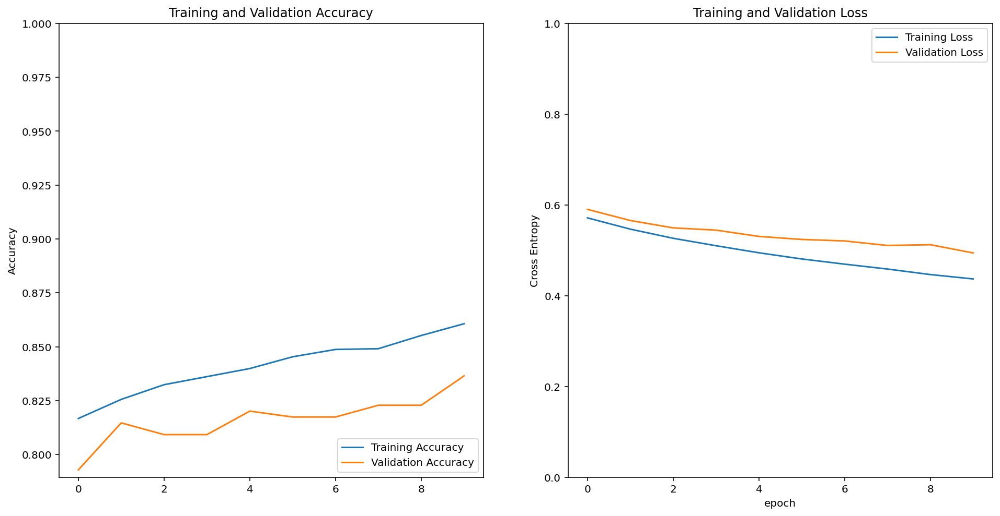

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [ ]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[1.3973366e-02, 4.5311373e-02, 8.1124890e-01, 1.9584518e-02,
        1.0988184e-01],
       [9.9957234e-01, 3.7037596e-04, 4.6044956e-06, 2.0386964e-05,
        3.2242700e-05],
       [7.8081858e-01, 1.0585269e-01, 1.9352963e-02, 7.5070575e-02,
        1.8905148e-02],
       [1.7590076e-03, 6.8234904e-03, 6.2962276e-01, 3.6724657e-03,
        3.5812226e-01],
       [6.9082248e-01, 2.6959926e-01, 1.2606484e-02, 9.6934531e-03,
        1.7278310e-02],
       [9.4776720e-01, 3.1399854e-02, 3.7100869e-03, 1.6295055e-02,
        8.2786079e-04],
       [8.2441159e-03, 5.8764312e-03, 8.8495690e-01, 6.3372590e-02,
        3.7550040e-02],
       [4.0514839e-01, 5.0171471e-01, 8.0137316e-04, 8.9978173e-02,
        2.3573218e-03],
       [6.5768925e-03, 9.8657527e-04, 2.4306959e-02, 9.0451306e-01,
        6.3616484e-02],
       [9.9966121e-01, 3.1793350e-04, 6.4501000e-07, 1.9411109e-05,
        7.7775832e-07],
       [9.7871828e-01, 1.7345564e-02, 6.4031134e-04, 2.5175265e-03,
        7.78

In [ ]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 0, 2, 0, 0, 2, 1, 3, 0, 0, 3, 3, 4, 0, 3, 2, 0, 2, 4, 2, 0,
       2, 0, 1, 3, 2, 4, 4, 3, 0, 4])

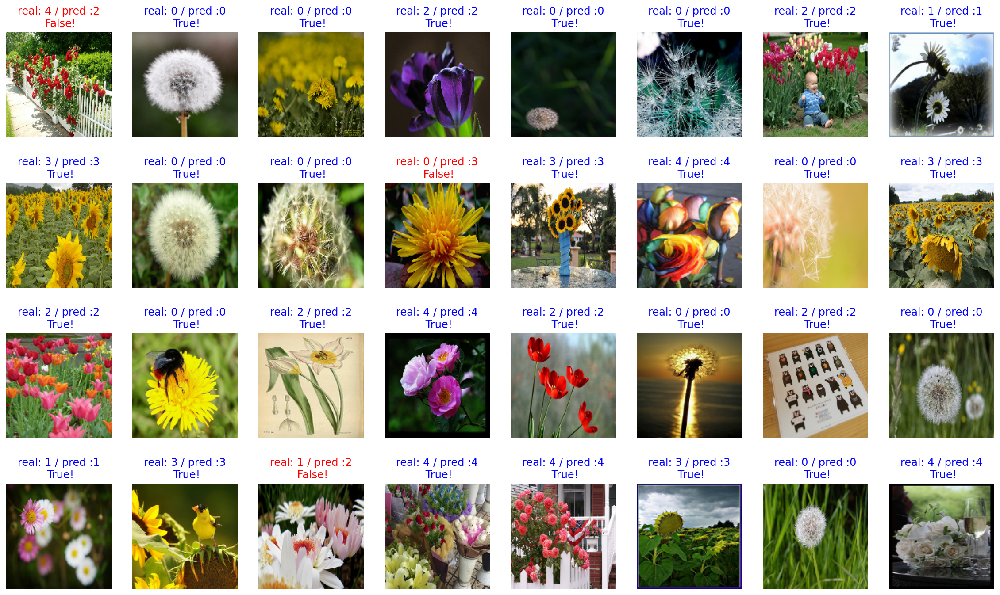

In [ ]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [ ]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 약 95% 내외

90.625
